In [36]:
import numpy as np
import math
import seaborn as sns
import pandas as pd
import scipy
from scipy import stats
import scipy.cluster.hierarchy as hac
import matplotlib.pyplot as plt
import copy


In [37]:
scipy.__version__

'0.19.0'

In [ ]:
#build 6 time series groups for testing, called: a,b,c,d,e,f

num_samples = 10
group_size = 100

#create the main time series for each group

x = np.linspace(0,5,num_samples)
scale = 4

a = scale*np.sin(x)
b = scale*(np.cos(1+x*3) + np.linspace(0,1,num_samples))
c = scale*(np.sin(2+x*6) + np.linspace(0,-1,num_samples))
d = scale*(np.cos(3+x*9) + np.linspace(0,4,num_samples))
e = scale*(np.sin(4+x*12)+np.linspace(0,-4,num_samples))
f = scale*np.cos(x)

#from each main series build 'group_size' series

timeSeries = pd.DataFrame()
ax = None
for arr in [a,b,c,d,e,f]:
    arr = arr + np.random.rand(group_size,num_samples)+np.random.randn(group_size,1)
    df = pd.DataFrame(arr)
    timeSeries = timeSeries.append(df)
    
    ax = sns.tsplot(ax=ax, data=df.values, err_style='unit_traces')
plt.show()

In [3]:
timeSeries.head()

,0,1,2,3,4,5,6,7,8,9
0,-0.792028,1.162096,2.382819,3.257449,2.152723,0.435131,-1.864176,-3.757977,-4.222272,-4.469542
1,1.048126,2.967832,4.634700,4.621218,4.068221,2.183980,0.250948,-1.431975,-3.134199,-3.303092
2,-1.803973,1.106537,1.927057,2.225435,1.507413,-0.455035,-2.392878,-3.733681,-5.666696,-5.478084
3,1.293407,3.145594,4.672121,4.847006,4.424229,2.337408,0.897782,-1.891306,-2.926964,-2.147036
4,2.937506,5.192779,6.201753,6.486647,5.764923,4.809016,1.787120,0.004439,-0.519117,-1.264175


In [3]:
# stirling_df = pd.read_csv("/Users/indrikwijaya/Downloads/stirling.txt", sep = '\t')

# stirling_df = stirling_df[stirling_df.time1!=0]
# stirling_df = stirling_df[stirling_df.time2!=0]
# stirling_df = stirling_df[stirling_df.time3!=0]
# stirling_df = stirling_df[stirling_df.time4!=0]
# stirling_df = stirling_df[stirling_df.time5!=0]
# stirling_df.head()

stirling_df = pd.read_csv("/Users/indrikwijaya/Downloads/stirling_logdiff.txt", sep = '\t')

In [4]:
# stirling_df['time1'] = stirling_df.apply(lambda x: math.log2(x['time1']), axis = 1)
# stirling_df['time2'] = stirling_df.apply(lambda x: math.log2(x['time2']), axis = 1)
# stirling_df['time3'] = stirling_df.apply(lambda x: math.log2(x['time3']), axis = 1)
# stirling_df['time4'] = stirling_df.apply(lambda x: math.log2(x['time4']), axis = 1)
# stirling_df['time5'] = stirling_df.apply(lambda x: math.log2(x['time5']), axis = 1)

stirling_df.head()


,time1,time2,time3,time4,time5,time6,time7
Q0010,0,1.741840,-0.495047,-0.029999,0.610275,1.067043,1.645865
Q0017,0,1.299452,0.236848,-0.404394,0.891562,1.397428,2.081607
Q0032,0,0.624103,0.434149,0.984648,0.543161,1.189677,1.944824
Q0055,0,0.326863,0.593972,0.655451,0.546563,1.077275,1.717299
Q0065,0,0.354283,0.462760,0.443381,0.567160,1.024055,1.594383


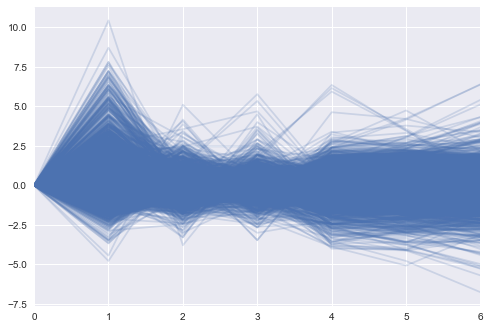

In [5]:
ax = None
ax = sns.tsplot(ax =ax, data = stirling_df.values, err_style = 'unit_traces')
plt.show()

In [12]:
rna_tot_mito_trans = pd.read_csv("/Users/indrikwijaya/Desktop/rna_logrpkm/rna_tot_mito_diff0.txt", sep ='\t')
rna_tot_mito_trans.head()

,t0,t1,t2,t3,t4,t5,t6
NM_175137,0.0,0.135322,0.889177,0.697614,0.379099,0.428496,0.365264
NM_008044,0.0,-0.629459,0.013002,-0.323229,-0.564980,-0.747261,-0.864981
NM_207207,0.0,0.625057,0.872643,0.701902,-0.042764,-0.674979,-0.574226
NM_001013381,0.0,0.458537,-0.257750,-0.743292,-1.030863,0.206261,-0.455475
NM_001013389,0.0,0.911548,1.159730,0.985482,1.327724,1.062785,1.359893


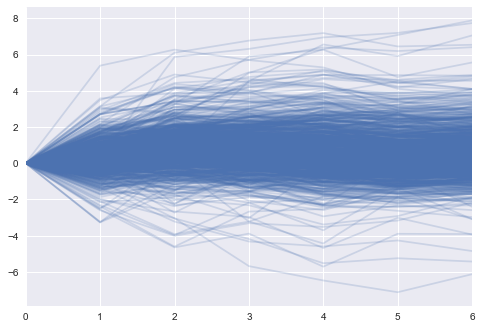

In [13]:
ax = None
ax = sns.tsplot(ax =ax, data = rna_tot_mito_trans.values, err_style = 'unit_traces')
plt.show()

In [14]:
rna_tot_mito = pd.read_csv("/Users/indrikwijaya/Desktop/rna_logrpkm/rna_tot_mito.txt", sep = '\t')
rna_tot_mito.head()

,t0,t1,t2,t3,t4,t5,t6
NM_175137,3.960592,4.095914,4.849770,4.658206,4.339691,4.389088,4.325856
NM_008044,4.315331,3.685871,4.328333,3.992102,3.750350,3.568070,3.450349
NM_207207,6.146943,6.772000,7.019586,6.848844,6.104179,5.471964,5.572717
NM_001013381,2.444733,2.903270,2.186983,1.701441,1.413871,2.650995,1.989258
NM_001013389,3.841136,4.752684,5.000866,4.826618,5.168860,4.903922,5.201029


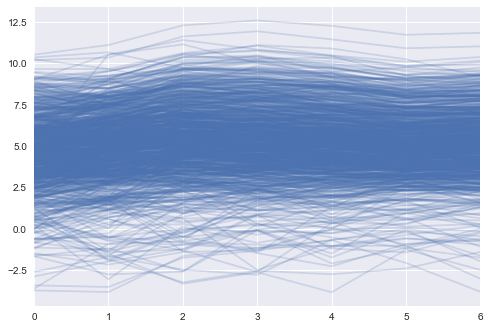

In [15]:
ax = None
ax = sns.tsplot(ax =ax, data = rna_tot_mito.values, err_style = 'unit_traces')
plt.show()

In [16]:
title_size = 85
figsize =(85,65)
xlabel_size = 85
ylabel_size = 85
xticks_size = 85
yticks_size = 85
def fancy_dendrogram(*args, **kwargs):
    max_d = kwargs.pop('max_d', None)
    if max_d and 'color_threshold' not in kwargs:
        kwargs['color_threshold'] = max_d
    annotate_above = kwargs.pop('annotate_above', 0)

    ddata = hac.dendrogram(*args, **kwargs)

    if not kwargs.get('no_plot', False):
        plt.title('Hierarchical Clustering Dendrogram', fontsize= title_size)
        plt.xlabel('sample index or (cluster size)', fontsize = xlabel_size)
        plt.ylabel('distance', fontsize = ylabel_size)
        plt.xticks(fontsize=xticks_size, rotation =90)
        plt.yticks(fontsize=yticks_size, rotation =90)
        for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, 'o', c=c)
                plt.annotate("%.3g" % y, (x, y), xytext=(0, -5),
                             textcoords='offset points',
                             va='top', ha='center')
        if max_d:
            plt.axhline(y=max_d, c='k')
    return ddata

#use spearman correlation
def my_metric(x,y):
    r = stats.pearsonr(x,y)[0]
    return 1-r #correlation to distance: range 0 to 2

In [17]:
from scipy.cluster.hierarchy import fcluster

def print_clusters(timeSeries, Z, k,path,plot=False):
    # k Number of clusters I'd like to extract
    results = fcluster(Z,k , criterion = 'maxclust')
    
    #check the results
    s = pd.Series(results)
    clusters = s.unique()
    clusters.sort()
    
    #save genes to excel
    writer = pd.ExcelWriter(path, engine = 'xlsxwriter')
    for c in clusters:
        cluster_indices = s[s==c].index
        print("Cluster %d number of entries %d" % (c, len(cluster_indices)))
        if plot:
            timeSeries.T.iloc[:,cluster_indices].transpose().to_excel(writer, sheet_name = str(c))
            timeSeries.T.iloc[:, cluster_indices].plot(legend = False)
            plt.xlabel('Time point', fontsize = 15)
            plt.ylabel('Log2 Exp value', fontsize = 15)
            plt.show()
    #writer.save()

#print_clusters(timeSeries, Z, 6, plot = True)

# Single


In [7]:
Z = hac.linkage(stirling_df, method = 'single', metric= 'correlation')

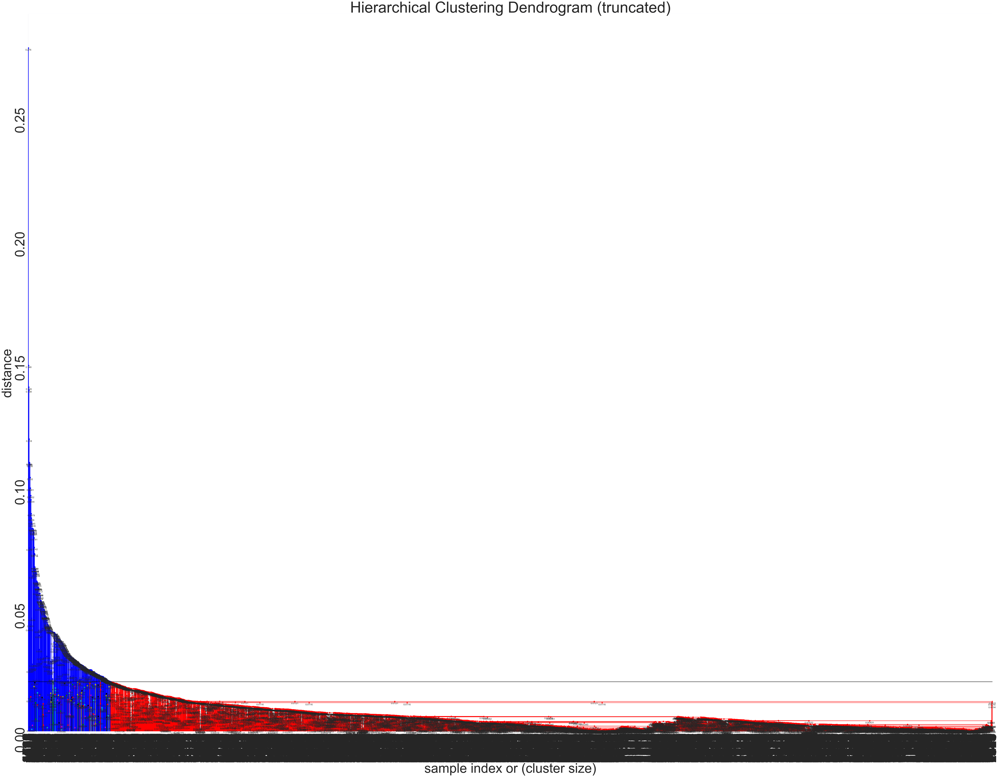

In [8]:
plt.figure(figsize=figsize)
plt.title("hierarchical clustering dendogram")
plt.xlabel('sample index', fontsize = xlabel_size)
plt.ylabel('distance', fontsize = ylabel_size)
plt.yticks(fontsize = yticks_size, rotation = 90)
#plot dendogram
fancy_dendrogram(
    Z,
    leaf_rotation = 90., #rotate the x axis labels
    leaf_font_size= 45., #font size for the x axis labels
    max_d = 0.02
)
plt.show()

# Complete

In [19]:
rna_tot_mito_trans_hac_comp = hac.linkage(rna_tot_mito_trans, method = 'complete', metric = my_metric)
leave_list = hac.leaves_list(rna_tot_mito_trans_hac_comp)

In [29]:
scipy.__version__

'0.19.0'

In [20]:
x = np.random.randn(len(leave_list))
hac.leaves_list(hac.optimal_leaf_ordering(rna_tot_mito_trans_hac_comp,x,metric = my_metric))
hac.

AttributeError: module 'scipy.cluster.hierarchy' has no attribute 'optimal_leaf_ordering'

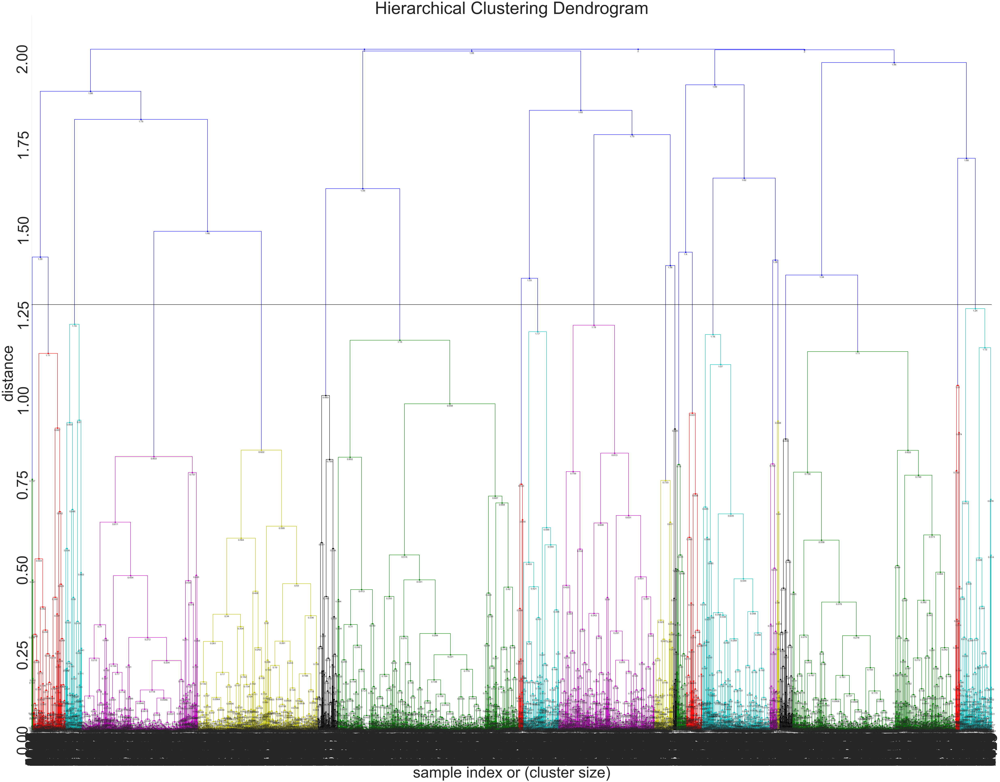

In [14]:
Z = hac.linkage(stirling_df, method = 'complete', metric= my_metric)

plt.figure(figsize=figsize)
plt.title("hierarchical clustering dendogram")
plt.xlabel('sample index', fontsize = xlabel_size)
plt.ylabel('distance', fontsize = ylabel_size)
plt.yticks(fontsize = yticks_size, rotation = 90)
#plot dendogram
fancy_dendrogram(
    Z,
    leaf_rotation = 90., #rotate the x axis labels
    leaf_font_size= 45., #font size for the x axis labels
    max_d = 1.25
)
plt.show()

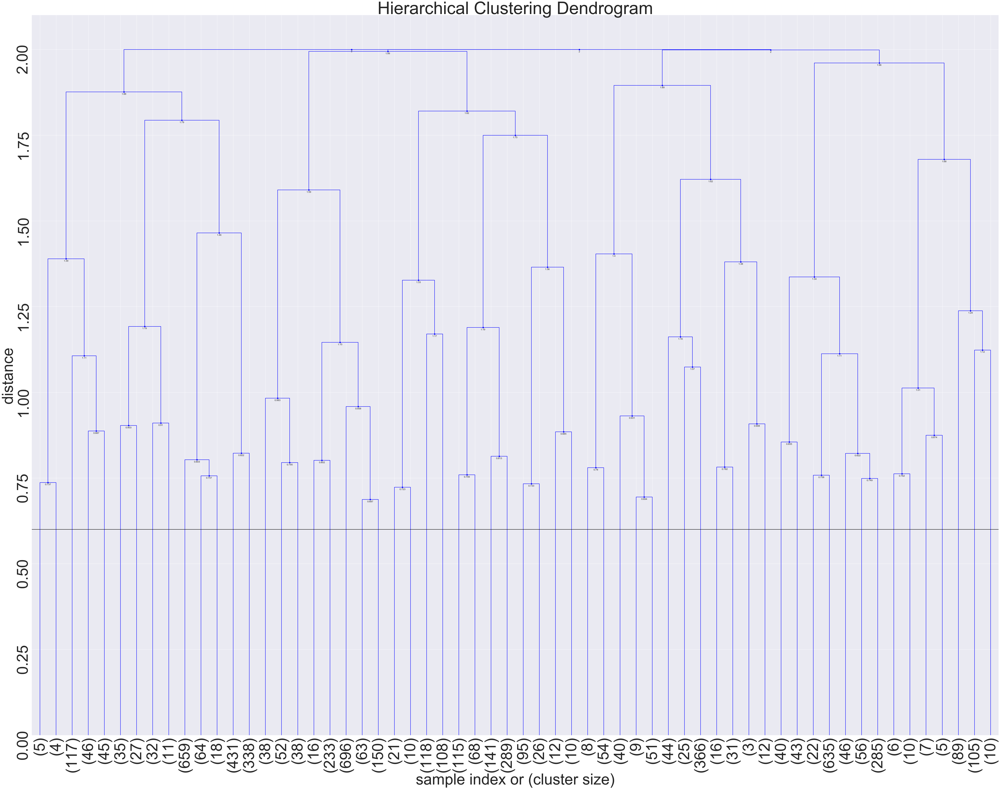

In [26]:
Z = hac.linkage(stirling_df, method = 'complete', metric= my_metric)

#plot dendogram
plt.figure(figsize=figsize)
plt.title("Hierarchical Clustering Dendogram")
plt.xlabel('sample index', fontsize = xlabel_size)
plt.ylabel('distance', fontsize = ylabel_size)
plt.yticks(fontsize = yticks_size, rotation = 90)

fancy_dendrogram(
    Z,
    truncate_mode = 'lastp',
    p = 60,
    leaf_rotation = 90., #rotate the x axis labels
    leaf_font_size= 45., #font size for the x axis labels
    max_d = 0.6
)
plt.show()

In [36]:
clusters = fcluster(Z,20,criterion = 'maxclust')


Cluster 1 number of entries 89


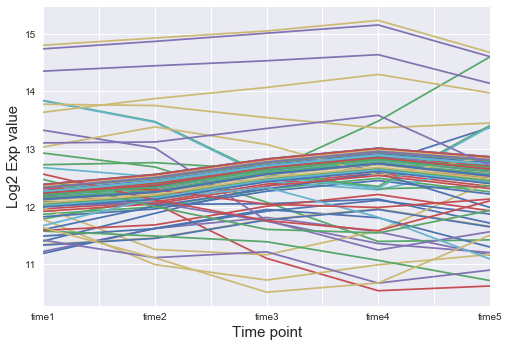

Cluster 2 number of entries 2


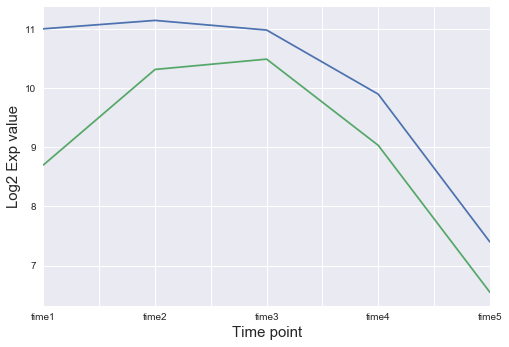

Cluster 3 number of entries 291


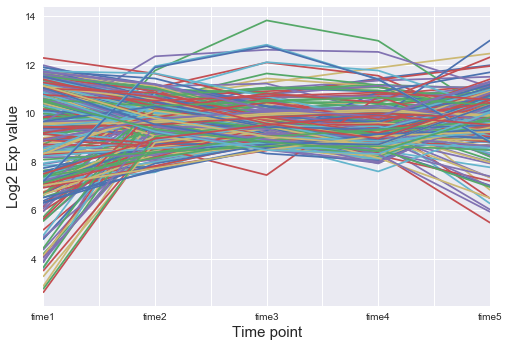

Cluster 4 number of entries 80


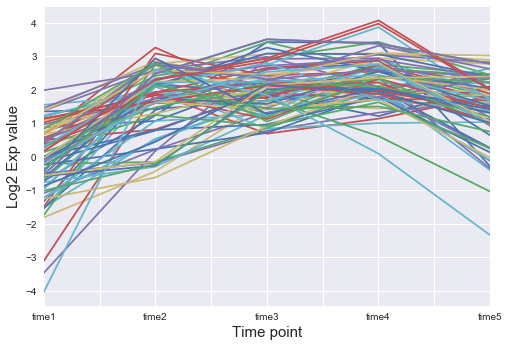

Cluster 5 number of entries 38


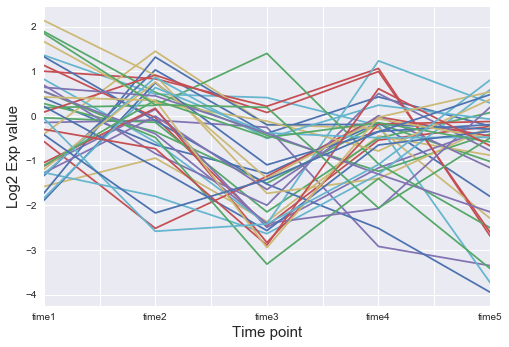

Cluster 6 number of entries 232


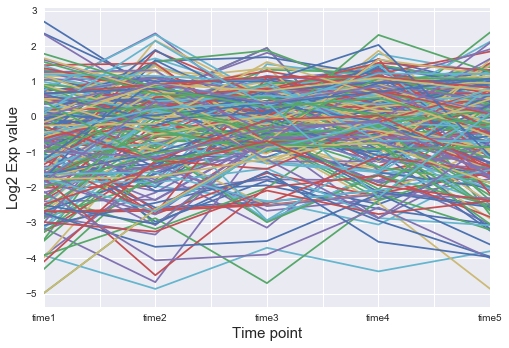

Cluster 7 number of entries 1


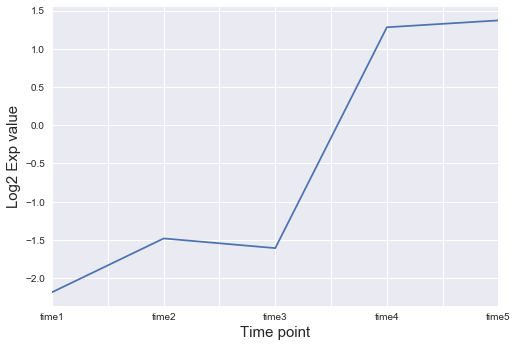

Cluster 8 number of entries 37


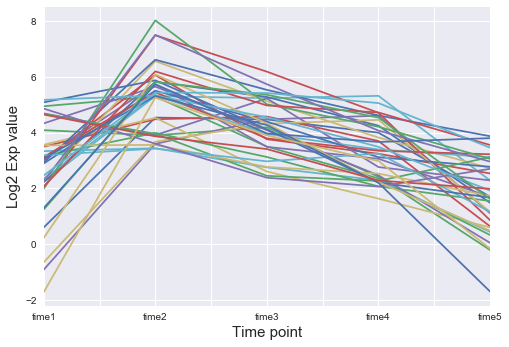

Cluster 9 number of entries 12


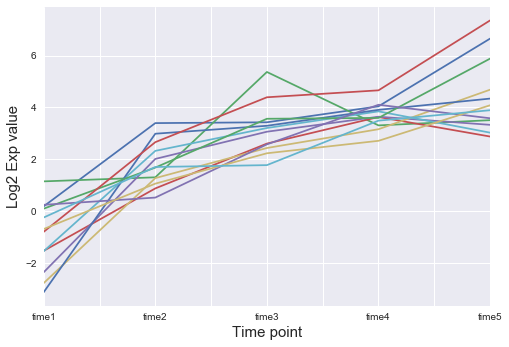

Cluster 10 number of entries 2402


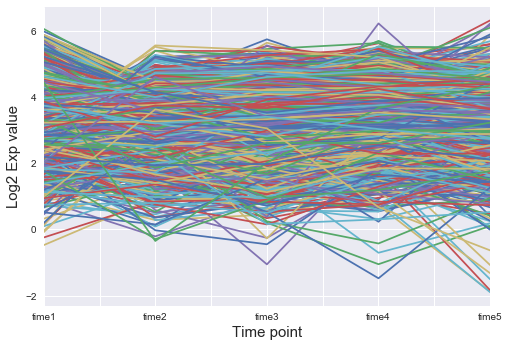

Cluster 11 number of entries 4


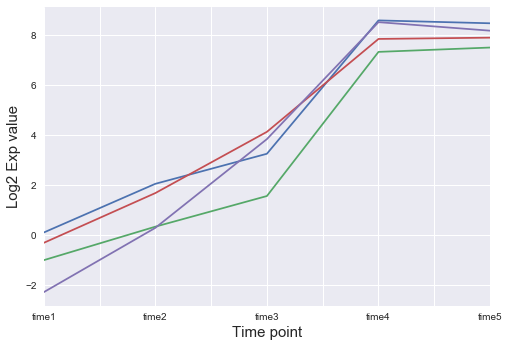

Cluster 12 number of entries 5


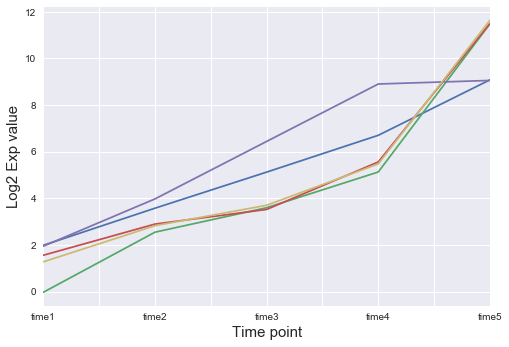

Cluster 13 number of entries 4


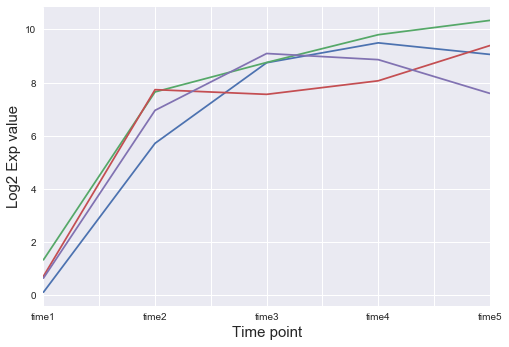

Cluster 14 number of entries 60


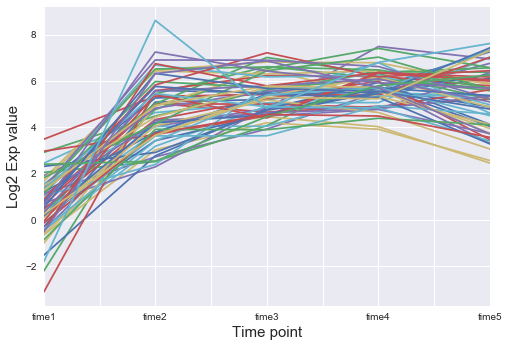

Cluster 15 number of entries 1336


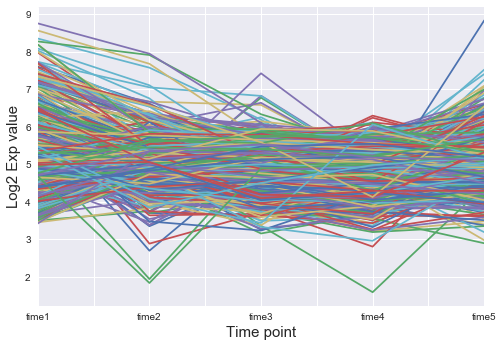

Cluster 16 number of entries 2


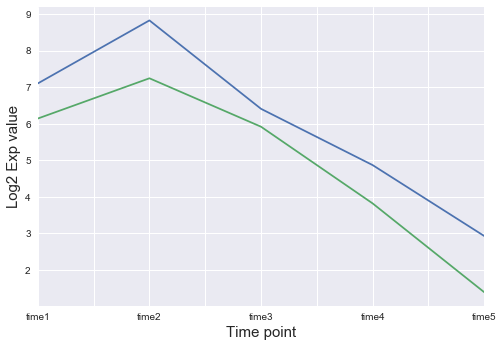

Cluster 17 number of entries 1


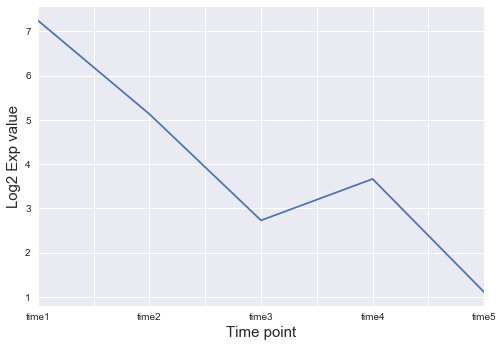

Cluster 18 number of entries 324


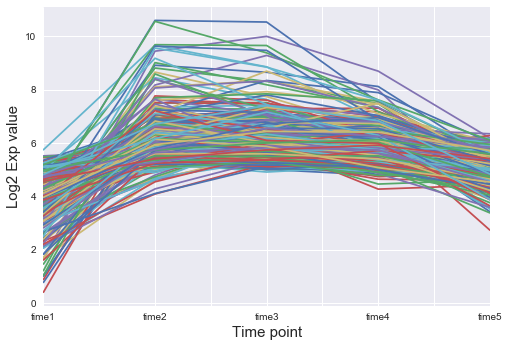

Cluster 19 number of entries 1228


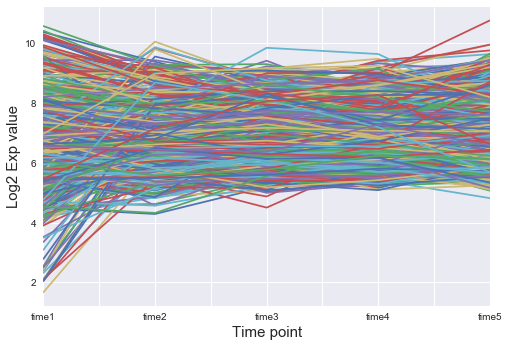

Cluster 20 number of entries 1


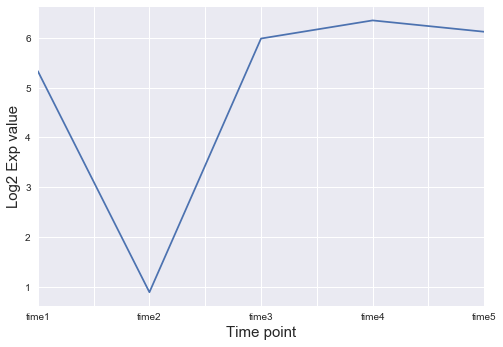

In [45]:
print_clusters(stirling_df, Z, 20, '/Users/indrikwijaya/Desktop/top_stem_filter.xlsx',plot = True)

# Average

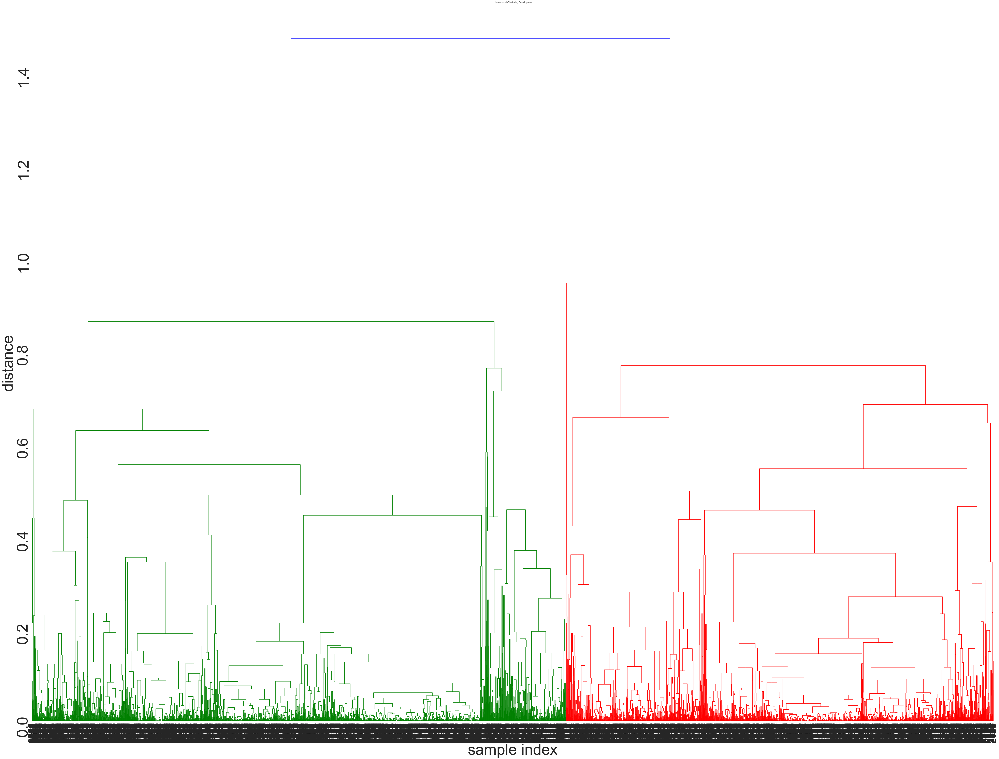

In [27]:
Z = hac.linkage(stirling_df, method = 'average', metric= my_metric)

#plot dendogram
plt.figure(figsize=figsize)
plt.title("Hierarchical Clustering Dendogram")
plt.xlabel('sample index', fontsize = xlabel_size)
plt.ylabel('distance', fontsize = ylabel_size)
plt.yticks(fontsize = yticks_size, rotation = 90)

hac.dendrogram(
    Z,
    leaf_rotation = 90., #rotate the x axis labels
    leaf_font_size= 45., #font size for the x axis labels
)
plt.show()

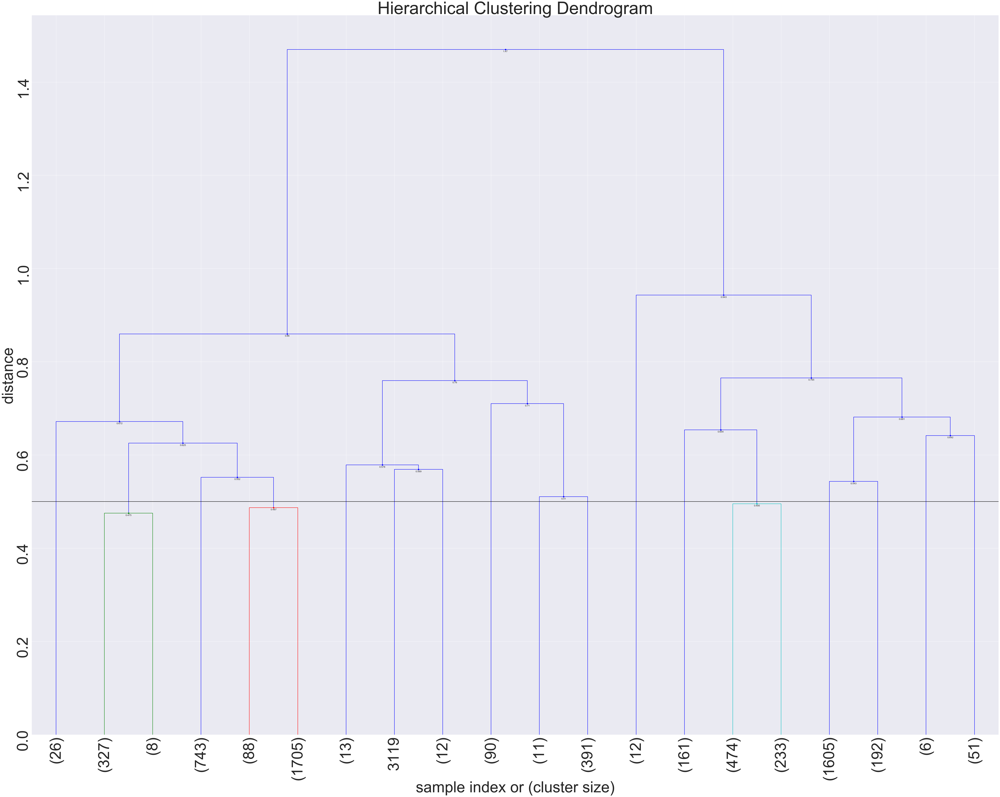

In [28]:
Z = hac.linkage(stirling_df, method = 'average', metric= my_metric)

#plot dendogram
plt.figure(figsize=figsize)
plt.title("Hierarchical Clustering Dendogram")
plt.xlabel('sample index', fontsize = xlabel_size)
plt.ylabel('distance', fontsize = ylabel_size)
plt.yticks(fontsize = yticks_size, rotation = 90)

fancy_dendrogram(
    Z,
    truncate_mode = 'lastp',
    p = 20,
    leaf_rotation = 90., #rotate the x axis labels
    leaf_font_size= 45., #font size for the x axis labels
    max_d = 0.5
)
plt.show()

# Weighted

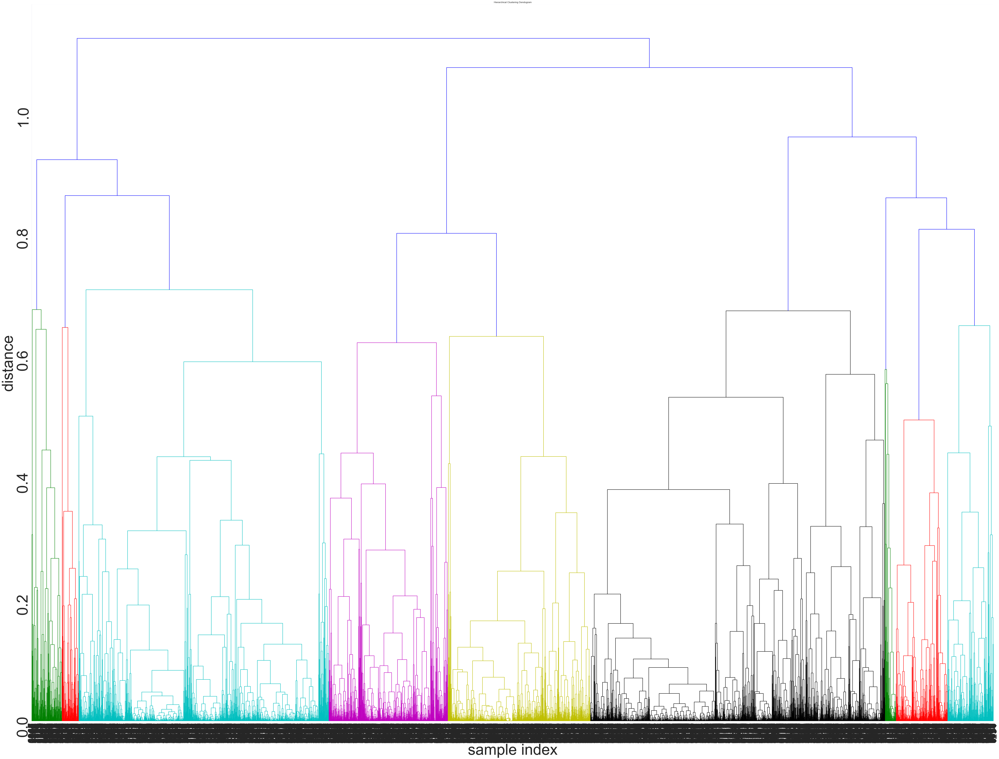

In [29]:
Z = hac.linkage(stirling_df, method = 'weighted', metric= my_metric)

#plot dendogram
plt.figure(figsize=figsize)
plt.title("Hierarchical Clustering Dendogram")
plt.xlabel('sample index', fontsize = xlabel_size)
plt.ylabel('distance', fontsize = ylabel_size)
plt.yticks(fontsize = yticks_size, rotation = 90)

hac.dendrogram(
    Z,
    leaf_rotation = 90., #rotate the x axis labels
    leaf_font_size= 45., #font size for the x axis labels
)
plt.show()

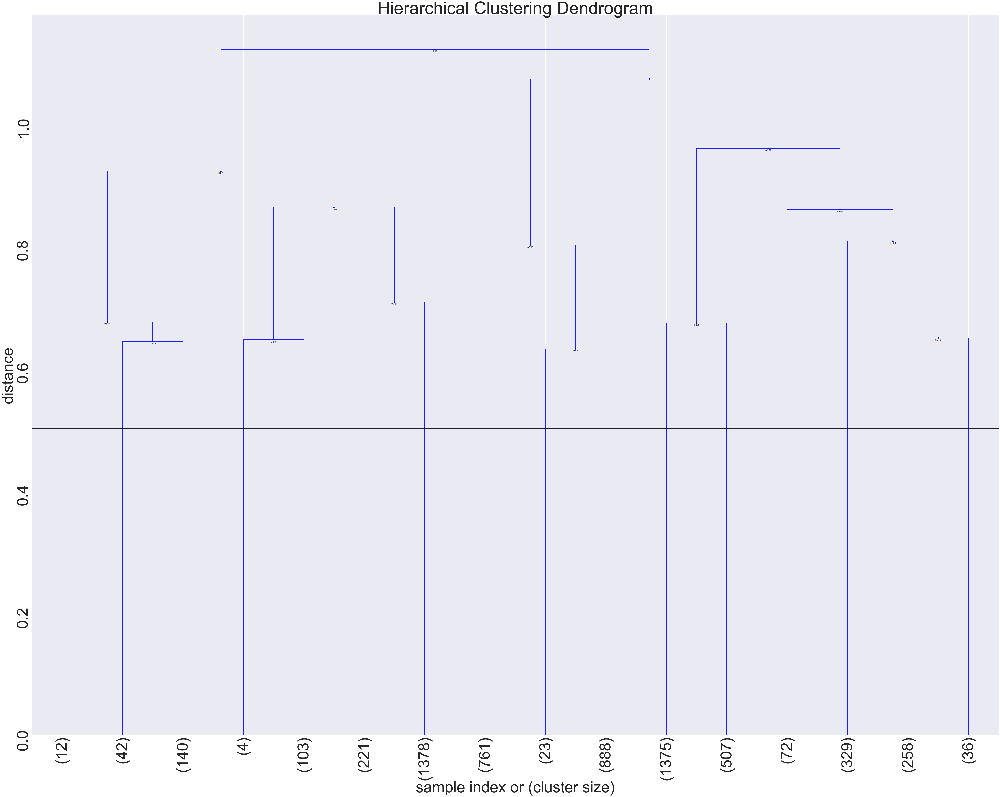

In [30]:
Z = hac.linkage(stirling_df, method = 'weighted', metric= my_metric)

#plot dendogram
plt.figure(figsize=figsize)
plt.title("hierarchical clustering dendogram")
plt.xlabel('sample index', fontsize = xlabel_size)
plt.ylabel('distance', fontsize = ylabel_size)
plt.yticks(fontsize = yticks_size, rotation = 90)

fancy_dendrogram(
    Z,
    truncate_mode = 'lastp',
    p = 16,
    leaf_rotation = 90., #rotate the x axis labels
    leaf_font_size= 45., #font size for the x axis labels
    max_d = 0.5
)
plt.show()

# Centroid

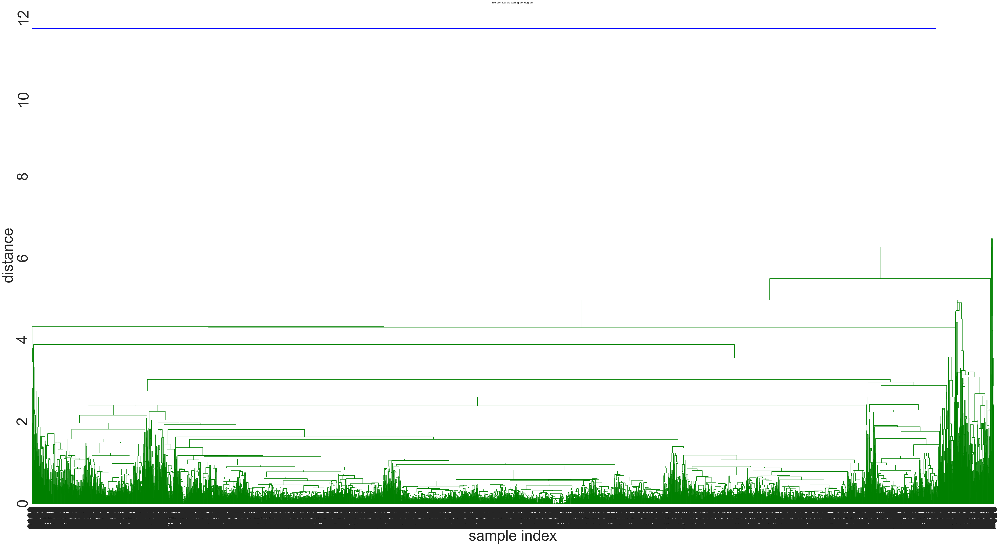

In [20]:
Z = hac.linkage(stirling_df, method = 'centroid', metric= 'euclidean')

#plot dendogram
plt.figure(figsize=(75,40))
plt.title("hierarchical clustering dendogram")
plt.xlabel('sample index', fontsize = 65)
plt.ylabel('distance', fontsize = 65)
plt.yticks(fontsize = 65, rotation = 90)

hac.dendrogram(
    Z,
    leaf_rotation = 90., #rotate the x axis labels
    leaf_font_size= 45., #font size for the x axis labels
)
plt.show()

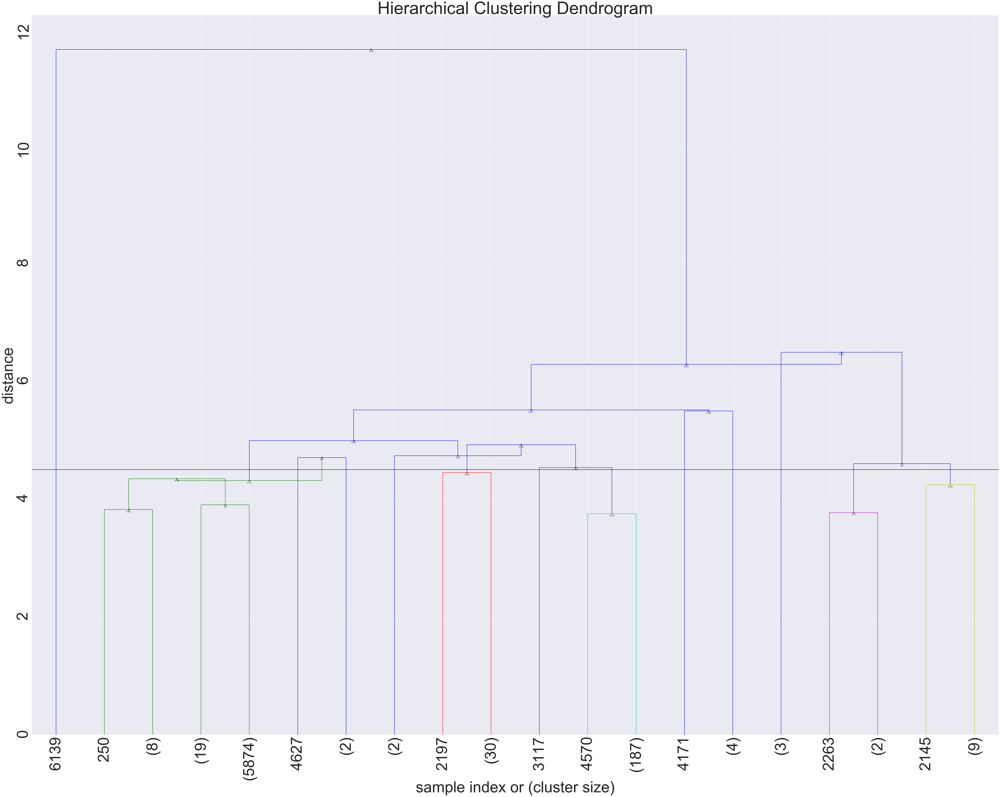

In [21]:
Z = hac.linkage(stirling_df, method = 'centroid', metric= 'euclidean')

#plot dendogram
plt.figure(figsize=figsize)
plt.title("hierarchical clustering dendogram")
plt.xlabel('sample index', fontsize = xlabel_size)
plt.ylabel('distance', fontsize = ylabel_size)
plt.yticks(fontsize = yticks_size, rotation = 90)

fancy_dendrogram(
    Z,
    truncate_mode = 'lastp',
    p = 20,
    leaf_rotation = 90., #rotate the x axis labels
    leaf_font_size= 45., #font size for the x axis labels
    max_d = 4.5
)
plt.show()

# Ward

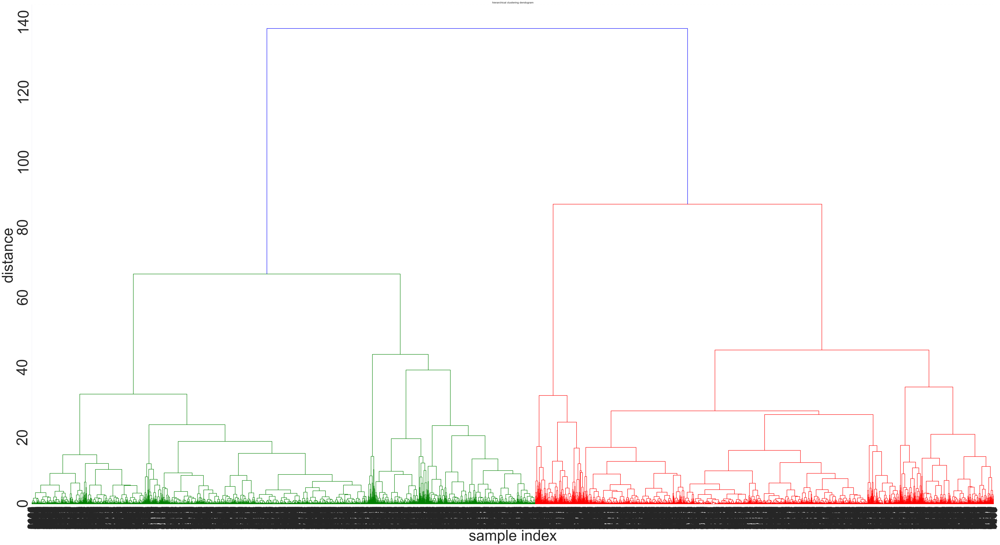

In [22]:
Z = hac.linkage(stirling_df, method = 'ward', metric= 'euclidean')

#plot dendogram
plt.figure(figsize=(75,40))
plt.title("hierarchical clustering dendogram")
plt.xlabel('sample index', fontsize = 65)
plt.ylabel('distance', fontsize = 65)
plt.yticks(fontsize = 65, rotation = 90)

hac.dendrogram(
    Z,
    leaf_rotation = 90., #rotate the x axis labels
    leaf_font_size= 45., #font size for the x axis labels
)
plt.show()

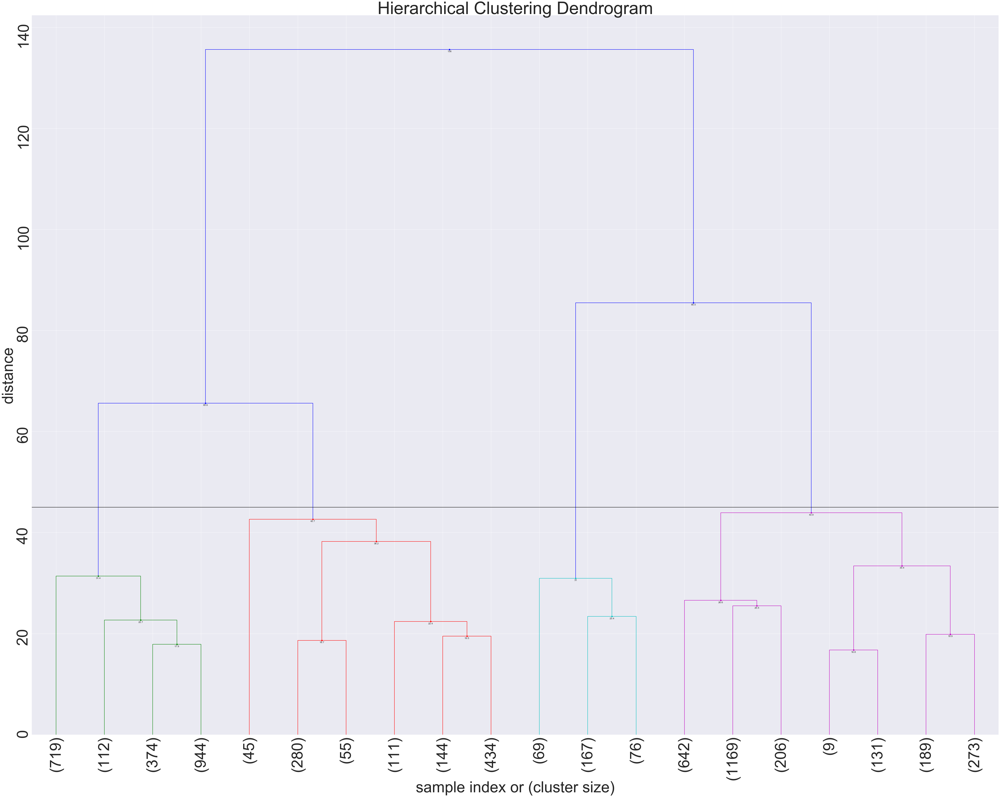

In [23]:
Z = hac.linkage(stirling_df, method = 'ward', metric= 'euclidean')

#plot dendogram
plt.figure(figsize=figsize)
plt.title("hierarchical clustering dendogram")
plt.xlabel('sample index', fontsize = xlabel_size)
plt.ylabel('distance', fontsize = ylabel_size)
plt.yticks(fontsize = yticks_size, rotation = 90)

fancy_dendrogram(
    Z,
    truncate_mode = 'lastp',
    p = 20,
    leaf_rotation = 90., #rotate the x axis labels
    leaf_font_size= 45., #font size for the x axis labels
    max_d = 45
)
plt.show()

# Median

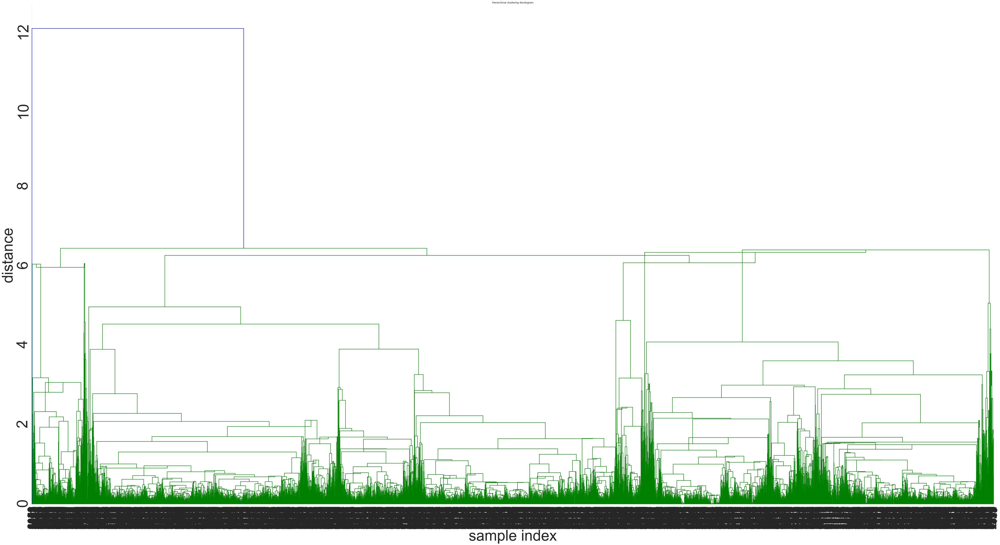

In [24]:
Z = hac.linkage(stirling_df, method = 'median', metric= 'euclidean')

#plot dendogram
plt.figure(figsize=(75,40))
plt.title("hierarchical clustering dendogram")
plt.xlabel('sample index', fontsize = 65)
plt.ylabel('distance', fontsize = 65)
plt.yticks(fontsize = 65, rotation = 90)

hac.dendrogram(
    Z,
    leaf_rotation = 90., #rotate the x axis labels
    leaf_font_size= 45., #font size for the x axis labels
)
plt.show()

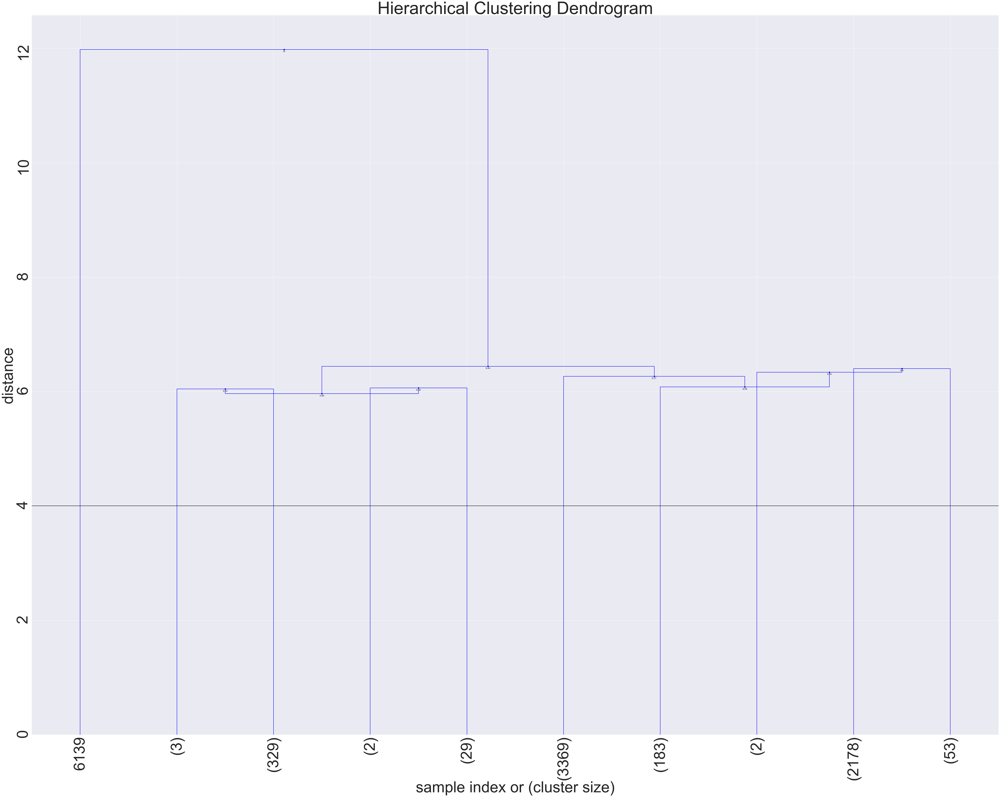

In [25]:
Z = hac.linkage(stirling_df, method = 'median', metric= 'euclidean')

#plot dendogram
plt.figure(figsize=figsize)
plt.title("hierarchical clustering dendogram")
plt.xlabel('sample index', fontsize = xlabel_size)
plt.ylabel('distance', fontsize = ylabel_size)
plt.yticks(fontsize = yticks_size, rotation = 90)

fancy_dendrogram(
    Z,
    truncate_mode = 'lastp',
    p = 10,
    leaf_rotation = 90., #rotate the x axis labels
    leaf_font_size= 45., #font size for the x axis labels
    max_d = 4
)
plt.show()